# Title: Methods for Music Structure Analysis
**general goal**: divide a given music represantation into temporal segments that correspond to musical parts and to group these segments into musically meaningful categories.

To this end, one needs to convert the waveform into a suitable feature representation that captures musical properties relevant for the structure of interest.

## General principles

Aspects to consider:
1. complexity of the problem depends on the kind of music representation to be analyzed
2. there are various principles including homogeneity, repetition, and novelty that a segmentation may be based on
3. one also has to account for different musical dimensions, such as melody, harmony, rhythm, or timbre.
4. the segmentation and structure largely depend on the musical context and the temporal hierarchy to be considered.

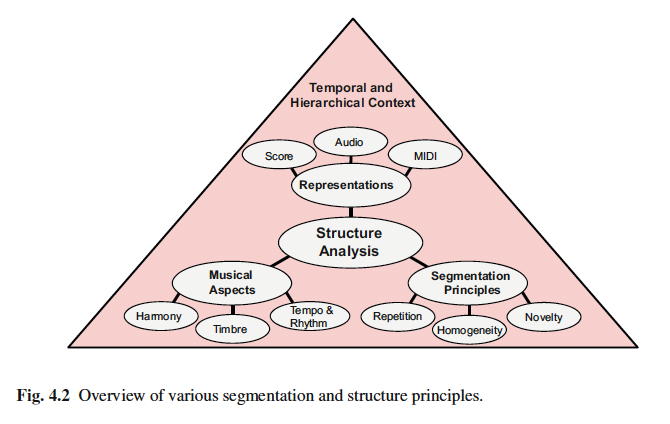

## Music Segmentation
Segmentation typically refers to the process of partitioning a given document into multiple segments with the goal of simplifying the representation into something that is more meaningful and easier to analyze than the original document.

For example: 
- in **image processing** the goal is to partition a given image into a set of regions such that each region is similar with respect to some characteristic such as color, intensity, or texture.
- in **music**, the segmentation task is to decompose a given audio stream into acoustically meaningful sections each corresponding to a continuous time interval that is specified by a start and end boundary.

At a *fine level*, the segmentation may aim to find the boundaries between individual notes or to find the beat intervals specified by beat positions. 
At a *coarser level*, the goal may be to detect changes in instrumentation or harmony or to **find the boundaries between verse and chorus sections**.

## Structure Analysis
Going beyond mere segmentation, the goal of structure analysis is to also **find and understand the relationships between the segments**. 
One main task of structure analysis is to not only segment the given music recording, but to also group the segments into musically meaningful categories (e.g., intro, chorus, verse, outro).

we want to roughly distinguish three different classes of methods. 
1. First, **repetition-based** methods are used to identify recurring patterns.
2. Second, **novelty-based** methods are employed to detect transitions between contrasting parts. 
3. Third, **homogeneity-based** methods are used to determine passages that are consistent with respect to some musical property.

novelty-based and homogeneity-based approaches are two sides of a coin: novelty detection is based on observing some surprising event or change after a more homogeneous segment.

## Musical Structure
Our focus is to analyze a given music recording on a rather coarse structural level. This level corresponds to what is often referred to as the musical structure, which describes the overall structural layout of a piece of music.

To specify musical structures, we now introduce some terminology:
- The term part is used in the context of the abstract music domain,
- whereas the term segment is used for the audio domain. 
- Furthermore, we use the term section in a rather vague way for both domains to denote either a segment or a part.
- Musical parts are typically denoted by the capital letters A,B,C, ... in the order of their first occurrence, where numbers (often written as subscripts) indicate the order of repeated occurrences. ($A_1 B_1 A_2 B_2 A_3$)

InWestern classical music, one of the most important musical structures is known as the sonata form, which is a large-scale musical structure typically used in the first movements of sonatas and symphonies. The basic sonata form consists of an exposition (E), a development (D), and a recapitulation (R), where the exposition is repeated once. Sometimes, one can find an additional introduction (I) and a closing coda (C), thus yielding the form $IE_1E_2DRC$.

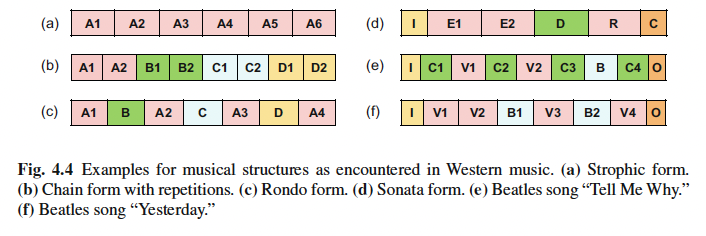

The most important parts of a pop song are the verse (V) and the chorus (C) sections.
Sometimes, pop songs may start with an intro (I) and close with an outro (O).
Finally, verse and chorus sections may be connected by an additional part called a bridge (B).

A musical structure can be rather vague, and even music experts may argue about the construction of a given composition.
- what we call a repetition of a musical section is often far from being an exact copy.
- musical structure is typically ordered in hierarchies, and it is often not clear which level should be considered when specifying
the musical structure.

example: Hungarian Dance No. 5 by Johannes Brahms
This piece is part of a set of 21 dance tunes composed by Brahms up to 1869 and based mostly on traditional Hungarian themes.

The musical structure as indicated in the figure is $A_1A_2B_1B_2CA_3B_3B_4D$, which consists of three repeating A-parts, four repeating B-parts, as well as a C-part and a short closing D-part.

The overall musical structure of this piece can be explained in terms of repeating elements.
A novelty-based segmentation procedure using tempo cues may be used to reveal the substructures of the C-part, whereas a homogeneity-based segmentation procedure using harmonic properties may be suited to distinguish the C-part from the other parts.

## Musical Dimensions

As a first representation, we consider chroma features.
A normalized chroma vector describes the signal’s local energy distribution over an analysis window (frame) across the twelve pitch classes of the equal-tempered scale (ignoring octave information). Capturing pitched content, a chroma-based feature sequence relates to harmonic and melodic properties of the music recording.

In [1]:
import librosa
import matplotlib.pyplot as plt

librosa.util.list_examples()

AVAILABLE EXAMPLES
--------------------------------------------------------------------
brahms    	Brahms - Hungarian Dance #5
choice    	Admiral Bob - Choice (drum+bass)
fishin    	Karissa Hobbs - Let's Go Fishin'
humpback  	Glacier Bay 60-second clip humpback whale song November 2020
libri1    	Ashiel Mystery - A Detective Story, chapter 2, narrated by Garth Comira
libri2    	The Age of Chivalry / Chapter 18: Perceval / Read by Anders Lankford
libri3    	Sense and Sensibility / Chapter 18 / Jane Austen / Read by Heather Barnett
nutcracker	Tchaikovsky - Dance of the Sugar Plum Fairy
pistachio 	The Piano Lady - Pistachio Ice Cream Ragtime
robin     	Bird Whistling, Robin, Single, 13.wav / InspectorJ
sweetwaltz	Setuniman - Sweet Waltz
trumpet   	Mihai Sorohan - Trumpet loop
vibeace   	Kevin MacLeod - Vibe Ace


In [2]:
from IPython.display import Audio

example = librosa.ex('brahms')
print(librosa.util.example_info('brahms'))

# load the audio as a waveform 'y'
# store the sampling rate as 'sr'
y, sr = librosa.load(example)

print(f'y.shape: {y.shape}')
print(f'samplerate: {sr}')
print(f'y.shape / sr: {y.shape[0] // sr} seconds')

Audio(y, rate=sr)

brahms    	Brahms - Hungarian Dance #5
--------------------------------------------------------------------
Hungarian Dance number 5 by Johannes Brahms / US Army Strings is in the Public Domain. 

From Musopen: https://musopen.org/music/43805-hungarian-dance-no-5-in-f-sharp-minor-woo-1-string-orchestra-arr/

Public Domain https://creativecommons.org/publicdomain/mark/1.0/

None
y.shape: (1010880,)
samplerate: 22050
y.shape / sr: 45 seconds


Let's take the full song, downloaded from [Internet Archive](https://archive.org/details/JohannesBrahmsHungarianDanceNo.5)

In [3]:
path = 'Johannes Brahms - Hungarian Dance No. 5.ogg'

y, sr = librosa.load(path)

# trim silent edges
y, _ = librosa.effects.trim(y)

print(f'y.shape: {y.shape}')
print(f'samplerate: {sr}')
print(f'y.shape / sr: {y.shape[0] // sr} seconds')

Audio(y, rate=sr)

y.shape: (4239360,)
samplerate: 22050
y.shape / sr: 192 seconds


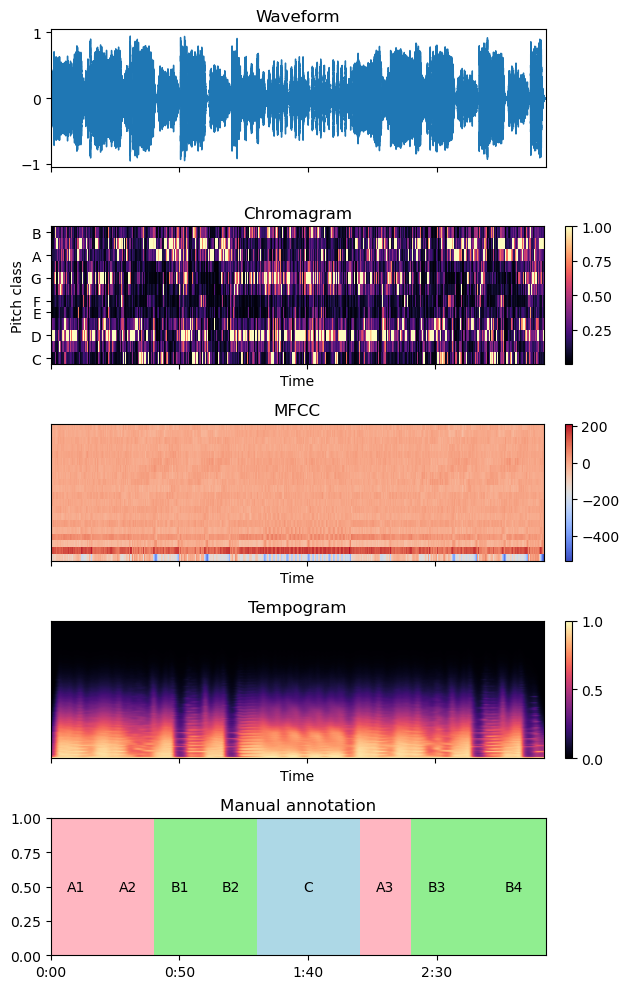

In [5]:
import matplotlib.patches as patches
from mpl_toolkits.axes_grid1 import make_axes_locatable

fig, ax = plt.subplots(nrows=5, sharex=True)    

# increase the size of each subplot
fig.set_figheight(10)

# waveform
ax[0].set(title='Waveform')
img = librosa.display.waveshow(y, sr=sr, ax=ax[0])

# Chroma-based features
ax[1].set(title='Chromagram')
chroma = librosa.feature.chroma_stft(y=y, sr=sr)
img1 = librosa.display.specshow(chroma, sr=sr, y_axis='chroma', x_axis='time', ax=ax[1])
fig.colorbar(img1, ax=ax[1], fraction=0.02, pad=0.04)

# MFCC-based features
ax[2].set(title='MFCC')
mfcc = librosa.feature.mfcc(y=y, sr=sr)
img2 = librosa.display.specshow(mfcc, sr=sr, x_axis='time', ax=ax[2])
fig.colorbar(img2, ax=ax[2], fraction=0.02, pad=0.04)

# Tempo-based features
ax[3].set(title='Tempogram')
tempogram = librosa.feature.tempogram(y=y, sr=sr)
img3 = librosa.display.specshow(tempogram, sr=sr, x_axis='time', ax=ax[3])
fig.colorbar(img3, ax=ax[3], fraction=0.02, pad=0.04)

# Manuallly generated annotation
ax[4].set(title='Manual annotation')

# TODO: fix values
segments = [
    ('A1', 0, 20, 'lightpink'),
    ('A2', 20, 40, 'lightpink'),
    ('B1', 40, 60, 'lightgreen'),
    ('B2', 60, 80, 'lightgreen'),
    ('C', 80, 120, 'lightblue'),
    ('A3', 120, 140, 'lightpink'),
    ('B3', 140, 160, 'lightgreen'),
    ('B4', 160, 200, 'lightgreen')
]

for seg in segments:
    label, start, end, color = seg
    rect = patches.Rectangle((start, 0), end - start, 1, edgecolor='none', facecolor=color)
    ax[4].add_patch(rect)
    ax[4].text((start + end) / 2, 0.5, label, ha='center', va='center')

# hide x-axis labels
for a in ax:
    a.label_outer()

# TODO: it works, but refactor needed?
## empty axis on right for colorbars
divider = make_axes_locatable(ax[0])
cax = divider.append_axes('right', size='5%', pad=0.05)
cax.axis('off')

divider = make_axes_locatable(ax[4])
cax = divider.append_axes('right', size='5%', pad=0.05)
cax.axis('off')

fig.tight_layout()

# Self-Similarity Matrix

To study musical structures and their mutual relations, one general idea is
to convert the music signal into a suitable feature sequence and then to compare each element of the feature sequence with all other elements of the sequence.

Given a feature sequence $X = (x_1, x_2, . . . , x_N)$, the idea is to compare all elements of the sequence with each other.
This results in an N-square self-similarity matrix $S ∈ R^{N×N}$ defined by
\begin{equation}
S(n,m) = s(x_n, x_m), 
\end{equation}
with $s: \mathcal F \times \mathcal F \to \mathbb R$ being a similarity function that measures the similarity between two feature vectors. 

Repetitive properties correspond to path-like structures.



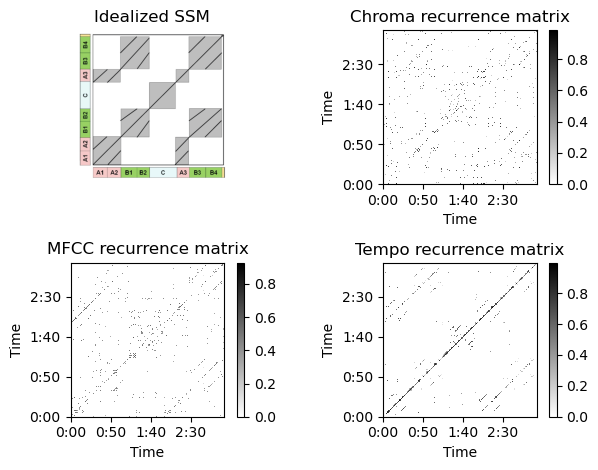

In [5]:
# cmap='gray_r' for reversed grayscale for better visibility
# estimated computed time: 2m 48s

fig, ax = plt.subplots(nrows=2, ncols=2)

# idealized ssm
image_path = 'ssm_ideal.png'
img = plt.imread(image_path)
ax[0][0].imshow(img)
ax[0][0].set(title='Idealized SSM')
ax[0][0].axis('off')

# with Chroma features
R = librosa.segment.recurrence_matrix(chroma, mode='affinity')
img = librosa.display.specshow(R, x_axis='time', y_axis='time', ax=ax[0][1], cmap='gray_r')
ax[0][1].set(title='Chroma recurrence matrix')
fig.colorbar(img, ax=ax[0][1])

# with MFCC features
R = librosa.segment.recurrence_matrix(mfcc, mode='affinity')
img = librosa.display.specshow(R, x_axis='time', y_axis='time', ax=ax[1][0], cmap='gray_r')
ax[1][0].set(title='MFCC recurrence matrix')
fig.colorbar(img, ax=ax[1][0])

# with Tempo features
R = librosa.segment.recurrence_matrix(tempogram, mode='affinity')
img = librosa.display.specshow(R, x_axis='time', y_axis='time', ax=ax[1][1], cmap='gray_r')
ax[1][1].set(title='Tempo recurrence matrix')
fig.colorbar(img, ax=ax[1][1])

fig.tight_layout()

# Enhancement strategies

The structural properties of an SSM decisively depend on the feature type used. For example, MFCC-based and related spectral-based features may be suitable to capture aspects such as instrumentation and timbre. Other features based on onset information or tempograms are used to capture beat, tempo, and rhythmic information.

In the following, we only consider the case of chroma-based audio features, which relate to harmonic and melodic properties.


Starting with a chroma representation of a given feature rate, this family comes along with two parameters: a length parameter $\mathcal l ∈ N$ (given in frames), which is used to smooth or average the feature values over consecutive frames, as well as a downsampling parameter $d$, which reduces the feature rate by a factor of $d$.

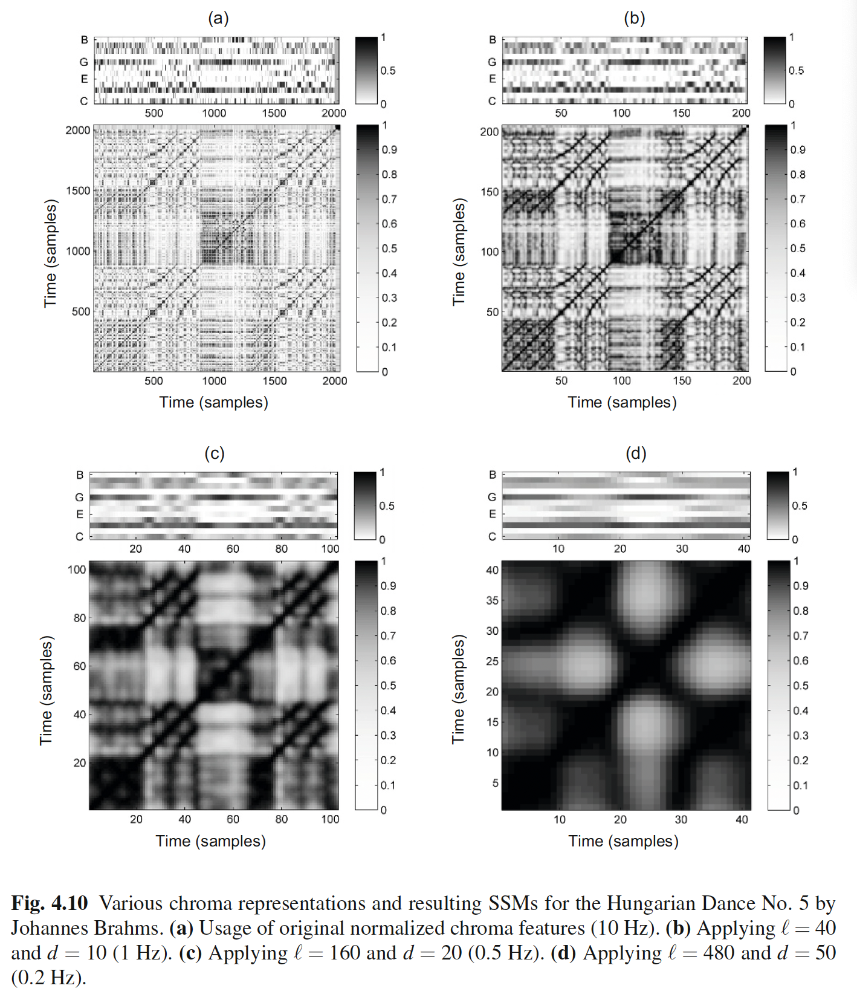

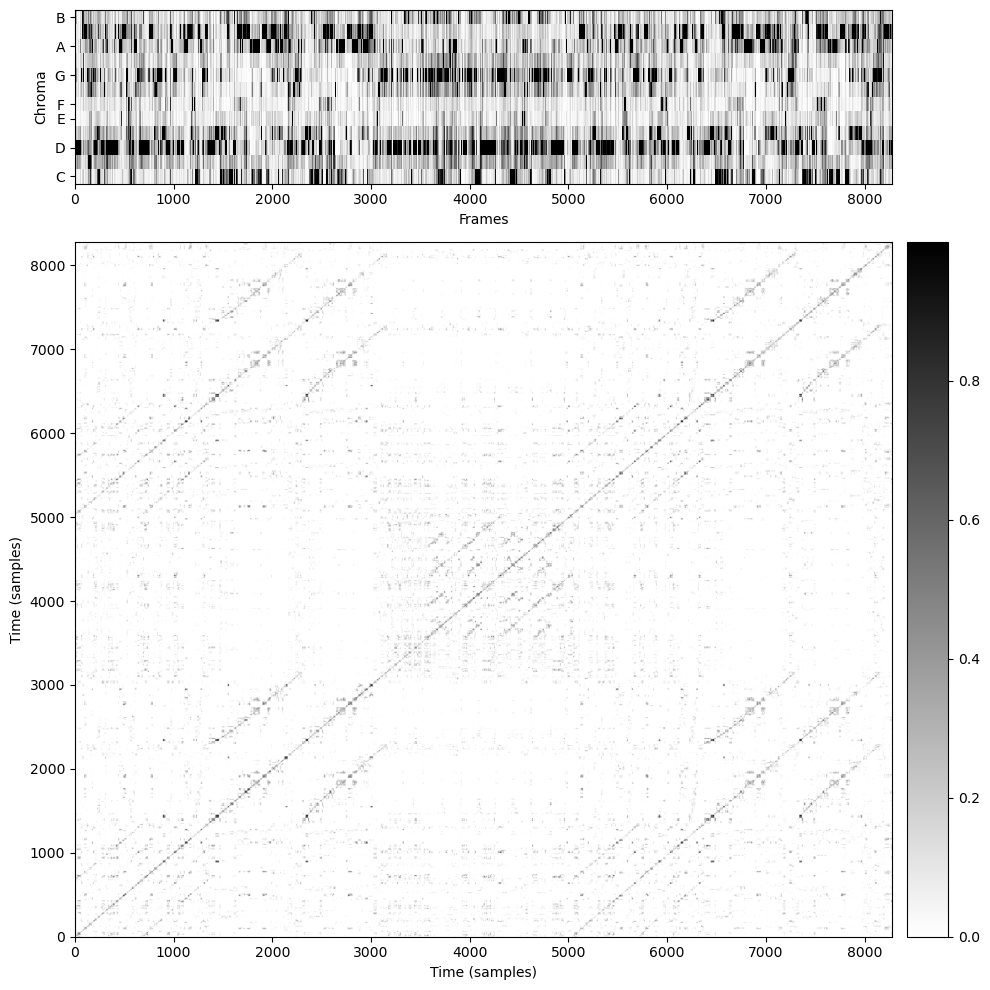

In [15]:
import matplotlib.gridspec as gridspec

def plot_chroma_similarity_matrix(chroma):
    S = librosa.segment.recurrence_matrix(chroma, mode='affinity', metric='cosine')

    # Create a figure
    fig = plt.figure(figsize=(10, 10))

    # Create grid spec
    gs = gridspec.GridSpec(2, 2, width_ratios=[20, 1], height_ratios=[1, 4])

    # Upper raster plot
    ax1 = plt.subplot(gs[0, 0])
    librosa.display.specshow(chroma, y_axis='chroma', x_axis='frames', ax=ax1, cmap='gray_r')
    ax1.set_ylabel('Chroma')

    # Lower similarity matrix plot
    ax2 = plt.subplot(gs[1, 0])
    img = ax2.imshow(S, aspect='auto', origin='lower', cmap='gray_r')
    ax2.set_xlabel('Time (samples)')
    ax2.set_ylabel('Time (samples)')

    # Colorbar for similarity matrix
    cbar_ax = plt.subplot(gs[1, 1])
    fig.colorbar(img, cax=cbar_ax, orientation='vertical')

    plt.tight_layout()
    plt.show()

plot_chroma_similarity_matrix(chroma)